In [1]:
%load_ext autoreload
%autoreload 2

%aimport peaks 
%aimport -peaks.core.fileIO.fileIO_opts

# ARPES data processing

In [2]:
# Import packages
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np
import peaks as pks
import os
import pint_xarray

# Set default options
xr.set_options(cmap_sequential='Purples', keep_attrs=True)
%matplotlib inline
%config InlineBackend.figure_format='retina'

ureg = pint_xarray.unit_registry

In [3]:
# Set the default file path
pks.opts.FileIO.path = os.getenv('PEAKS_EXAMPLE_DATA_PATH')

## Binding energy and k-space conversions  
The function :class:`peaks.core.processing.k_convert`, most conveniently accessed via the accessor `.k_convert`, allows converting ARPES data to binding energy and $k$-space, with conventions automatically following the analyser type and taking care of different scan types.

### Conversion to binding energy
To convert data to binding energy, we need some reference for the Fermi level. This should be stored as a metadata entry, as is set via the method `.EF_correction.set()`. 
:::{note}Photon energy scans
For most scans, a single `EF_correction` attribute is maintained. However, for [photon energy scans](#photon-energy-scans), an additional $hv$-dependent correction is added as another data coordinate. 
:::

The following references of the Fermi level correction are currently accepted:
- fitting parameters generated by a fit to the Fermi energy of e.g. a poly gold sample, in a dictionary form of polynomial coefficients, e.g.:
```
{'c0': 105.07837338559817,
 'c1': 0.00021092006222556432,
 'c2': -6.373415730141268e-05,
 'c3': -2.3182740086084596e-07}
```
- The correct form is automatically output by fitting a reference sample using `peaks`'s in-built [Au fitting function](./5_data_fitting.ipynb#fitting-au-fermi-edge-data), which can be passed directly to `.EF_correction.set()`
- a float, resulting in a rigid shift of the Fermi level.

E.g. taking a reference poly gold scan:

Fitting:   0%|          | 0/85 [00:00<?, ?it/s]

poly4


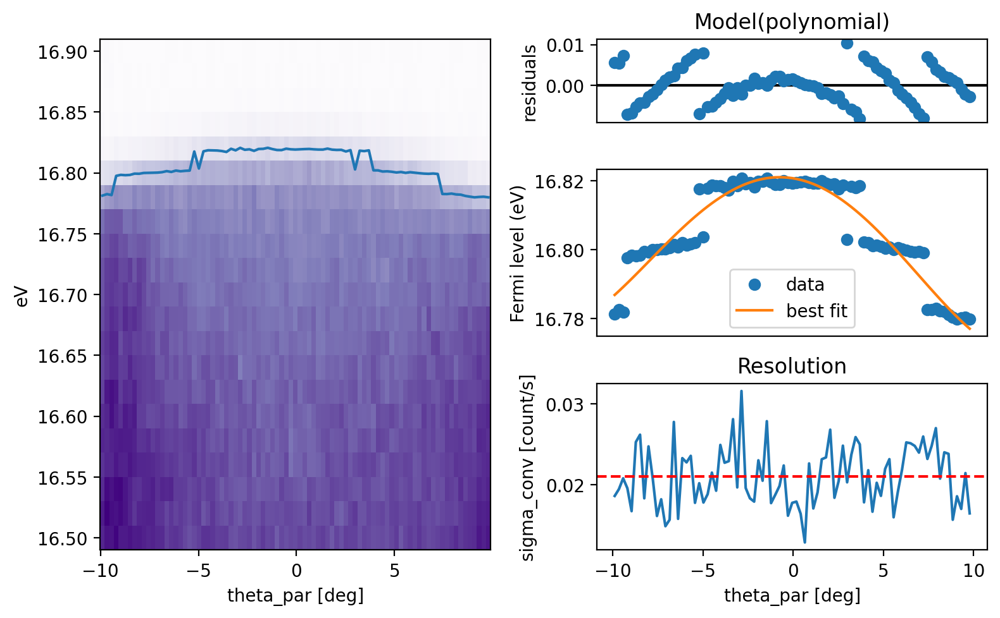

<div class="alert alert-block alert-success"><b>Au fitting results: </b> Polynomial Fermi level correction (order 4): c0: 16.820662, c1: -0.000854, c2: -0.000563, c3: 3e-06, c4: 2e-06;   Average resolution: 0.021 eV </div>

In [4]:
#Load relevant Au correction
gold = pks.load("Gold.xy").sel(eV=slice(16.5,None), theta_par=slice(-10,10)).bin_data(theta_par=4)
gold_fit_result = gold.fit_gold()

The resulting fit is stored as an attribute of the returned fit result:

In [5]:
gold_fit_result.EF_correction

{'c0': 16.820661910280492,
 'c1': -0.0008539311600179978,
 'c2': -0.0005631770706169424,
 'c3': 3.402917192582315e-06,
 'c4': 1.695453350555507e-06}

The $E_\mathrm{F}$ correction can be set directly from the fit_result:

In [6]:
gold.EF_correction.set(gold_fit_result)

In [7]:
gold.EF_correction

EF_correction:
    c0: 16.820661910280492
    c1: -0.0008539311600179978
    c2: -0.0005631770706169424
    c3: 3.402917192582315e-06
    c4: 1.695453350555507e-06

The underlying data structure defining the EF correction can be obtained via the `.get()` method:

In [8]:
gold.EF_correction.get()

{'c0': 16.820661910280492,
 'c1': -0.0008539311600179978,
 'c2': -0.0005631770706169424,
 'c3': 3.402917192582315e-06,
 'c4': 1.695453350555507e-06}

The EF correction can also be defined to be like another scan:

In [9]:
# Load a dispersion
disp1 = pks.load("210326_GM2-667_GK_1.xy")

# Set the Fermi correction reference from the gold scan which already has this applied
disp1.EF_correction.set_like(gold)

In [10]:
disp1.EF_correction

EF_correction:
    c0: 16.820661910280492
    c1: -0.0008539311600179978
    c2: -0.0005631770706169424
    c3: 3.402917192582315e-06
    c4: 1.695453350555507e-06

It can also be passed directly to set all members of a :class:`xarray.DataTree`:

In [11]:
# Load data into a tree
dt = pks.load(["Gold.xy", "210326_GM2-667_GK_1.xy"])

# Set the EF_correction
dt.EF_correction.set_like(gold)

Loading data:   0%|          | 0/2 [00:00<?, ?it/s]

In [12]:
dt.Gold.EF_correction

EF_correction:
    c0: 16.820661910280492
    c1: -0.0008539311600179978
    c2: -0.0005631770706169424
    c3: 3.402917192582315e-06
    c4: 1.695453350555507e-06

### $k$-conversion
:class:`peaks` implements momentum conversion assuming the use of a hemispherical-type analyser with an entrance slice, with or without deflectors for virtual scanning of the angular axes, following the conventions of Ishida and Shin (https://aip.scitation.org/doi/10.1063/1.5007226). The conversion is exact (no small angle approximations are made). The following analyser types are currently supported:
- Type I: analyser slit aligned with main rotary axis of manipulator (defined in the file loader with `_analyser_slit_angle = 0 * ureg('degrees')`), often called 'vertical' slit for a vertically-oriented sample manipualator;
- Type II: analyser slit perpendicular to main rotary axis of manipulator (`_analyser_slit_angle = 90 * ureg('degrees')`), often called 'horizontal' slit.

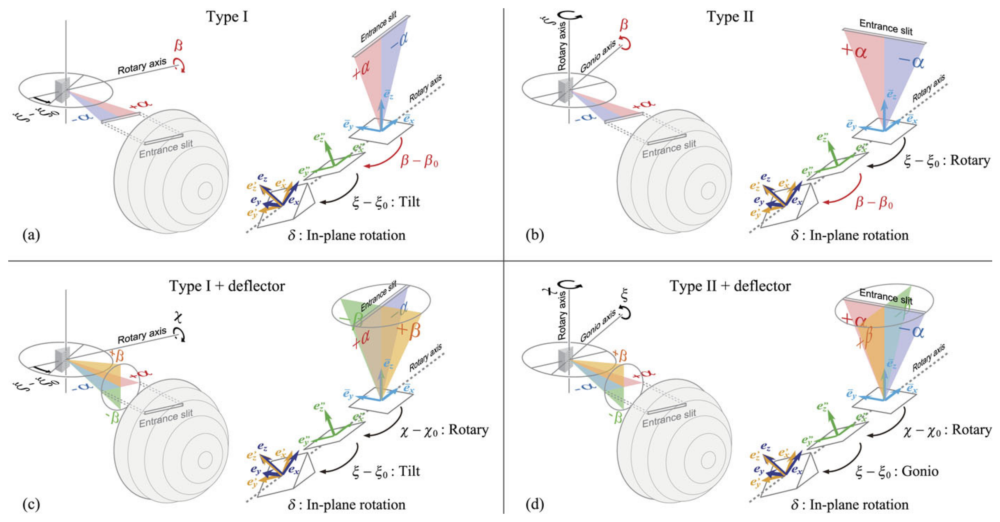

In [13]:
plt.figure(figsize=(16,8))
plt.imshow(plt.imread("./k_conv_angle_conventions.jpeg"))
plt.axis('off')
plt.show()

There are different conventions regarding relative angles in use at different facilities. For momentum conversion, `peaks` attempts to rigidly follow the above conventions, translating `peaks` angle conventions to match to the above. However, to facilite transparent measurements when using these facilities, the raw axis numbers are never reversed, e.g. `polar=5` should always correspond to 5 on the physical polar axis. 

:::{note}
To aid in tracking sign changes required for use in momentum conversion, file loaders should implement class variables `_manipulator_sign_conventions` and `_analyser_sign_conventions` which contain dictionaries mapping the axis to a sign where the physical axes differ from these conventions, e.g. if the sign of relative rotation of the analyser polar angle is opposite to that of the manipulator polar angle, or e.g. if the analyser is mounted such that the readout of the detector is reversed relative to conventions of Ishida and Shin. These can be specified as e.g.:
```python
_manipulator_sign_conventions = {'tilt': -1,
                                'azi': -1}
                                 
_analyser_sign_conventions = {'polar': -1}
```

:::{danger}
Note, at present in the re-implementation of `peaks`, a lot changed under the hood in how we deal with this, and so there are many errors in tracking normal emissions and sign conventions for these things. Please take care when performing k-space conversions and also using the automated methods to feed back normal emission values - please report issues at https://gitlab.st-andrews.ac.uk/physics-and-astronomy/king-group/peaks/-/issues/3
:::
:::

### Dispersions
To process e.g. a dispersion: 

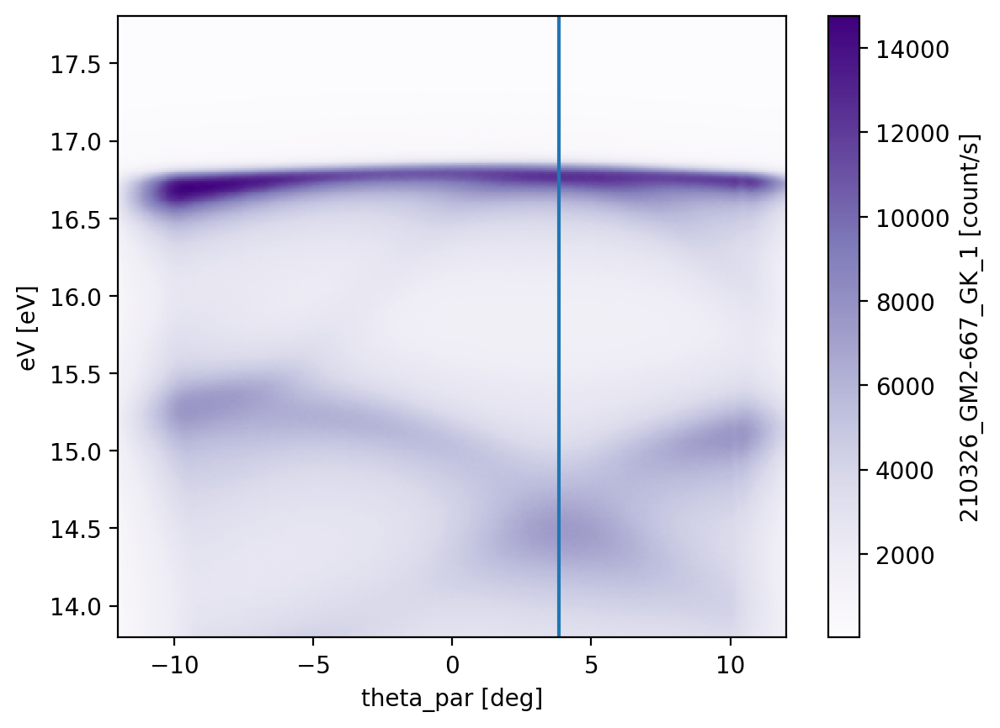

In [14]:
# Estimate normal emission from our dispersion
disp1.plot()
plt.axvline(3.85)

Set the normal emission values as described in the [metadata guide](./1_getting_started.ipynb#setting_manipulator_normal_emissions).

In [15]:
disp1 = pks.load("210326_GM2-667_GK_1.xy")

In [16]:
disp1.metadata.set_normal_emission(theta_par=3.85*ureg.deg)

In [17]:
disp1.metadata.manipulator

polar:
    local_name: Theta
    value: None
    reference_value: 3.85 deg
tilt:
    local_name: Phi
    value: None
    reference_value: None
azi:
    local_name: Azi
    value: None
    reference_value: None
x1:
    local_name: X
    value: None
    reference_value: None
x2:
    local_name: Y
    value: None
    reference_value: None
x3:
    local_name: Z
    value: None
    reference_value: None

In [18]:
%time disp1_k = disp1.k_convert()

Converting data to k-space - initialising:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/scipy/ndimage/_filters.py:115: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  input = np.asarray(input)


<div class="alert alert-block alert-warning"><b>Analysis warning: </b> EF_correction set from automatic estimation of Fermi level to: 16.82 eV.. NB may not be accurate. </div>

/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/numexpr/necompiler.py:765: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  arguments.append(numpy.asarray(a))
/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2497: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  args = tuple(asanyarray(arg) for arg in args)


CPU times: user 1.29 s, sys: 120 ms, total: 1.4 s
Wall time: 1.45 s


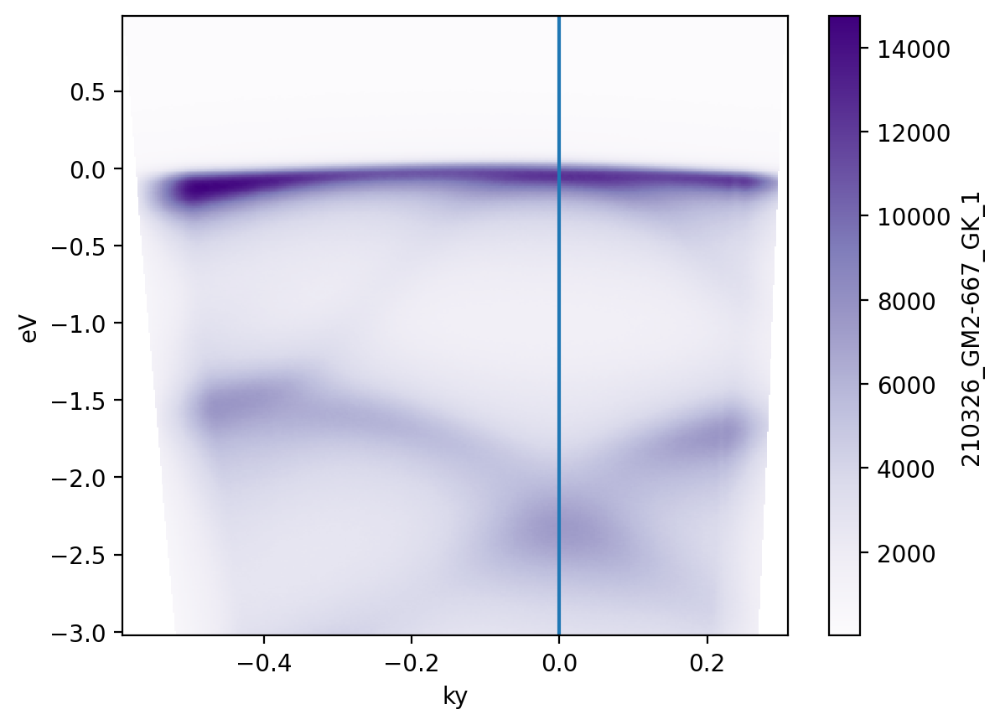

In [19]:
disp1_k.plot()
plt.axvline(0)

We can specify a desired k-point range and step size by providing the `ky` argument (note depending on the analyser, this could be `kx`) as a `slice(start, stop, step)`. Note, any of these can be retained at the default by passing `None` for that parameter:

Converting data to k-space - initialising:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/numexpr/necompiler.py:765: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  arguments.append(numpy.asarray(a))
/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2497: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  args = tuple(asanyarray(arg) for arg in args)


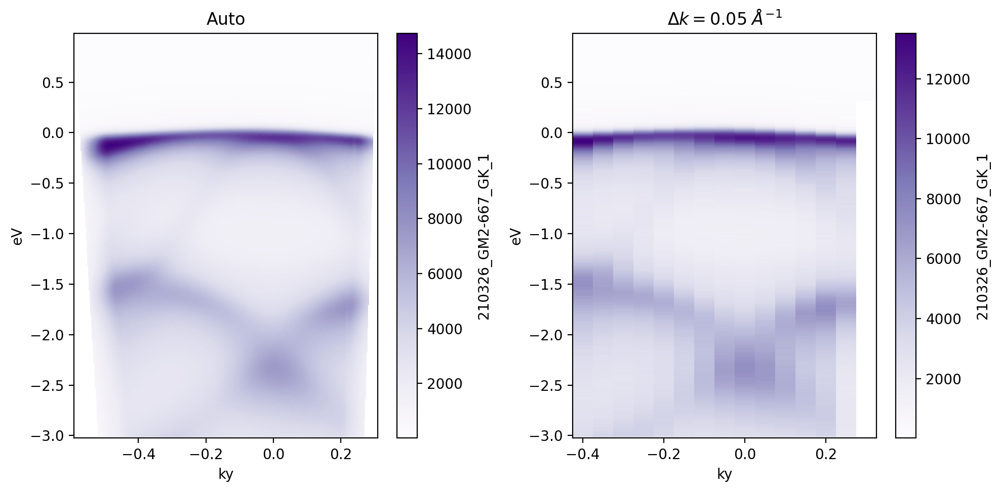

In [20]:
disp1_k2 = disp1.k_convert(ky=slice(-0.4,None,0.05))
pks.plot_grid([disp1_k, disp1_k2], titles=["Auto", "$\\Delta{}k=0.05\\;\\AA^{-1}$"])

:::{tip}
Specifying a reduced step size for the $k$ conversion only reduces the sampling density for the interpolation, it does not bin the data. If you are happy with a larger step size, it is better to first [bin the data](#data-binning) using e.g.:

```python
disp1.bin_data(theta_par=2)
```
:::

Note that the methods attempt to estimate unspecified parameters if they are not set - note the `Analysis warning` boxes returned. E.g. if passing a freshly loaded dispersion without setting the `EF_correction` attribute, an automatic determination of the Fermi level will be attempted: 

Converting data to k-space - initialising:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/scipy/ndimage/_filters.py:115: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  input = np.asarray(input)


<div class="alert alert-block alert-warning"><b>Analysis warning: </b> EF_correction set from automatic estimation of Fermi level to: 16.82 eV.. NB may not be accurate. </div>

/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/numexpr/necompiler.py:765: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  arguments.append(numpy.asarray(a))
/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2497: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  args = tuple(asanyarray(arg) for arg in args)


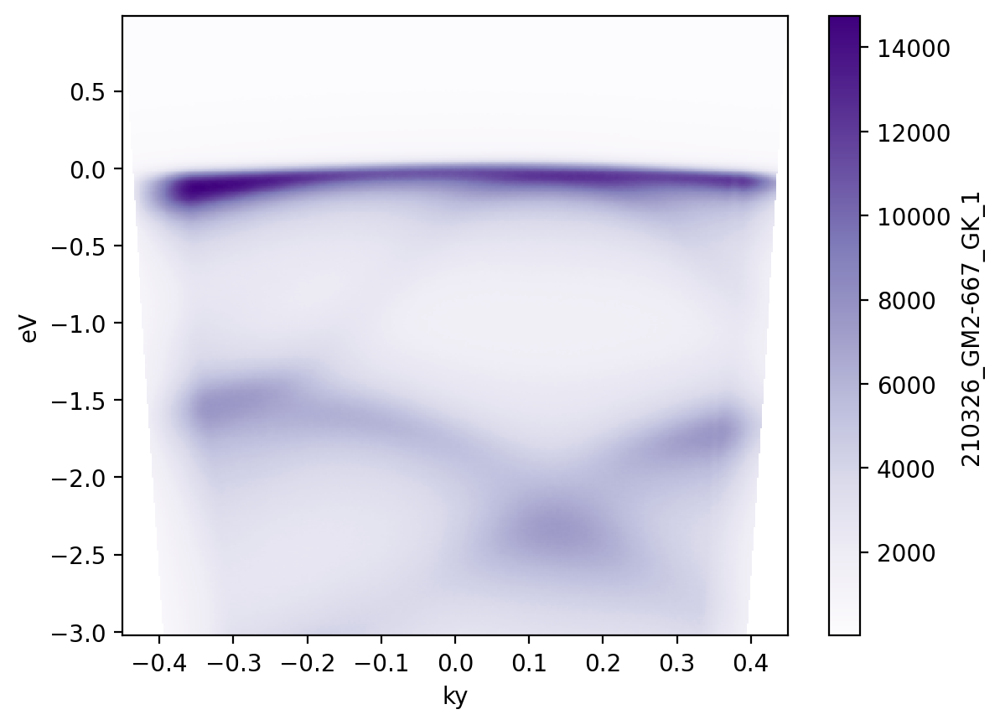

In [21]:
disp1_copy = pks.load("210326_GM2-667_GK_1.xy")
disp1_copy.k_convert().plot()

:::{warning}
These automatic estimations are useful for a quick look, but should not be relied upon for careful analysis!
:::

### Fermi surfaces
Fermi surface corrections work in the same way as for dispersions.

In [22]:
#Load a Fermi map and relevant Au correction
FS = pks.load('i05-59818.nxs', lazy=False)
gold = pks.load('i05-59853.nxs')
# Select a smaller range
gold = gold.sel(theta_par=slice(-16,17), eV=slice(104.9,105.2)).bin_data(theta_par=5,eV=2)

[########################################] | 100% Completed | 5.26 s


In [23]:
FS

Magnitude,[[[0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] ... [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0]] [[0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] ... [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0]] [[0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] ... [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0]] ... [[0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] ... [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0]] [[0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] ... [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0]] [[0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] ... [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0]]]
Units,count/s


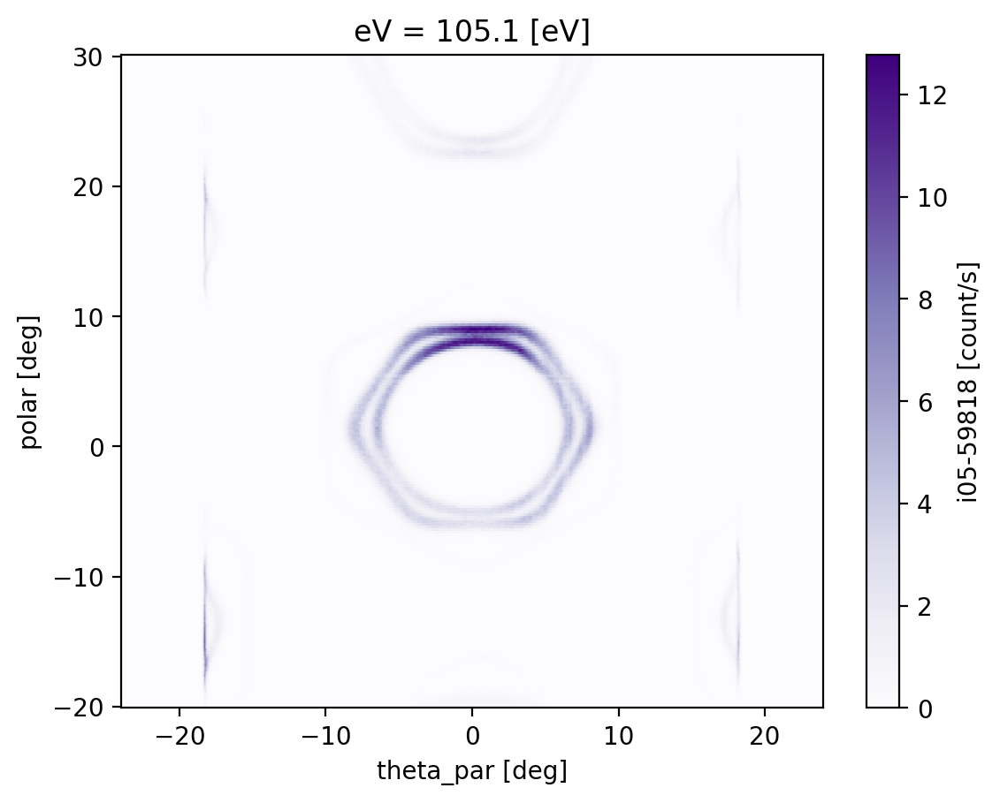

In [24]:
FS.MDC(105.06, 0.05).plot()
FS.metadata.set_normal_emission({'polar': '1.506 deg', 'azi': '-12 deg', 'theta_par': '0.142 deg'})

In [25]:
FS.metadata.manipulator

polar:
    local_name: sapolar
    value: [-19.9992378484 30.00095257238] deg
    reference_value: 1.506 deg
tilt:
    local_name: satilt
    value: 0.006 deg
    reference_value: 0.148 deg
azi:
    local_name: saazimuth
    value: -12.510000138999999 deg
    reference_value: -12 deg
x1:
    local_name: sax
    value: 1.089 mm
    reference_value: None
x2:
    local_name: say
    value: [0.171 0.42000000000000004] mm
    reference_value: None
x3:
    local_name: saz
    value: -2.8659999999999854 mm
    reference_value: None

Fitting:   0%|          | 0/137 [00:00<?, ?it/s]

poly4


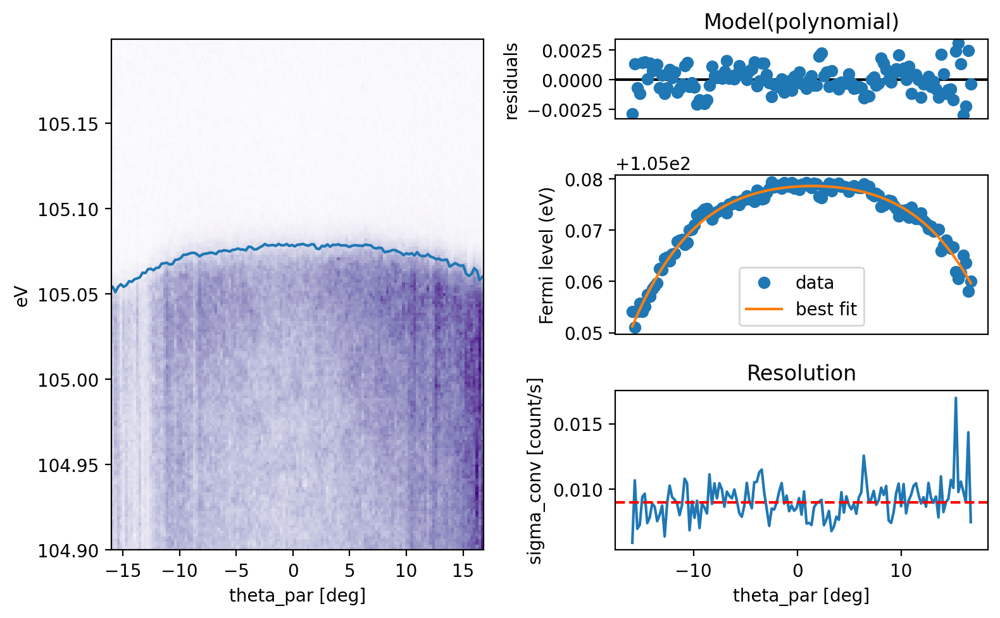

<div class="alert alert-block alert-success"><b>Au fitting results: </b> Polynomial Fermi level correction (order 4): c0: 105.078504, c1: 0.000127, c2: -4.5e-05, c3: 1e-06, c4: -0.0;   Average resolution: 0.009 eV </div>

In [26]:
fit_result = gold.fit_gold()
FS.EF_correction.set(fit_result)

To return just a single slice in energy, the `eV_slice=(centre, width)` argument can be used, with the arguments specified in binding energy:

Converting data to k-space - initialising:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/pdk6/Library/Mobile Documents/com~apple~CloudDocs/Work/Software/peaks/peaks/core/process/k_conversion.py:694: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  beta_range = np.asarray([np.min(angles["beta"]), np.max(angles["beta"])])
/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/numexpr/necompiler.py:765: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  arguments.append(numpy.asarray(a))
/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2497: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  args = tuple(asanyarray(arg) for arg in args)


Interpolating onto new grid:   0%|                 | 0/25800775 [00:00<?, ?it/s]

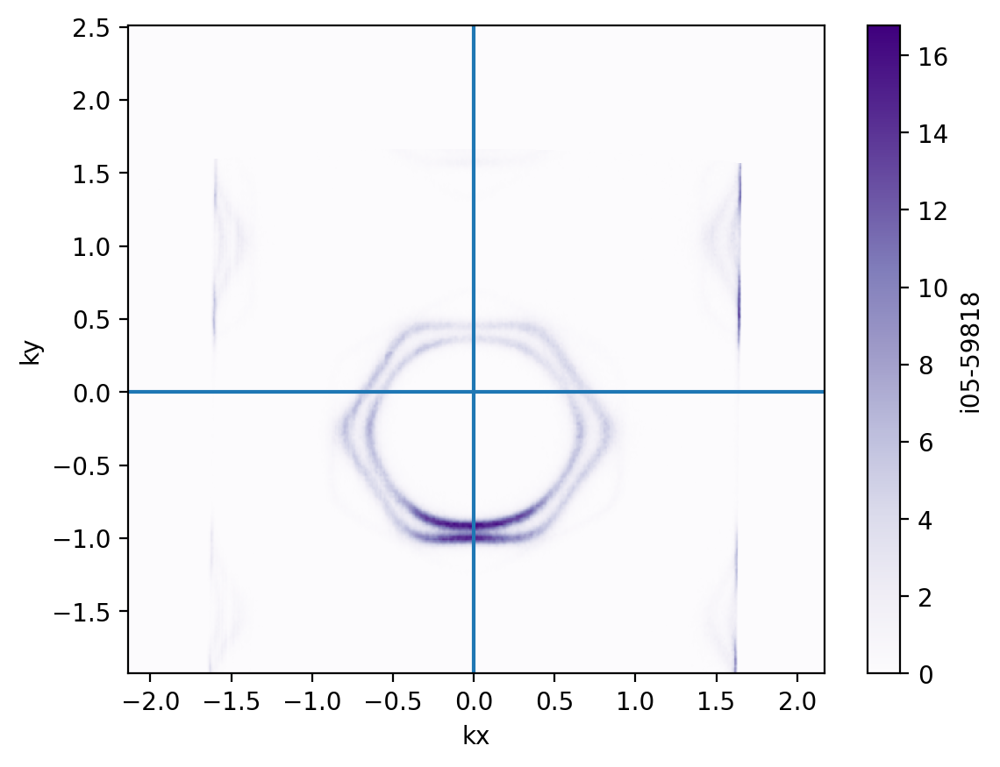

In [27]:
FSM_k = FS.k_convert(eV_slice=(-0.05,0.02))
FSM_k.plot()
plt.axvline(0)
plt.axhline(0)

Or the full cube can be $k$-converted

:::{tip}
`peaks` uses :class:`numba` and :class:`numexpr` to accelerate the interpolations and relevant angle <--> $k$ calculations, making the $k$-conversions rather fast. Still, for a large map these can still be somewhat time consuming, and it is often better perform binning on the data first.
:::

In [28]:
FS_bin = FS.bin_spectra(2)  # 2x2 bin on the eV and theta_par dimensions

In [29]:
FS_bin.attrs['norm_azi'] = -28
FS_bin_k = FS_bin.k_convert()

Converting data to k-space - initialising:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/pdk6/Library/Mobile Documents/com~apple~CloudDocs/Work/Software/peaks/peaks/core/process/k_conversion.py:694: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  beta_range = np.asarray([np.min(angles["beta"]), np.max(angles["beta"])])
/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/numexpr/necompiler.py:765: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  arguments.append(numpy.asarray(a))
/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2497: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  args = tuple(asanyarray(arg) for arg in args)


Interpolating onto new grid:   0%|                | 0/149422248 [00:00<?, ?it/s]

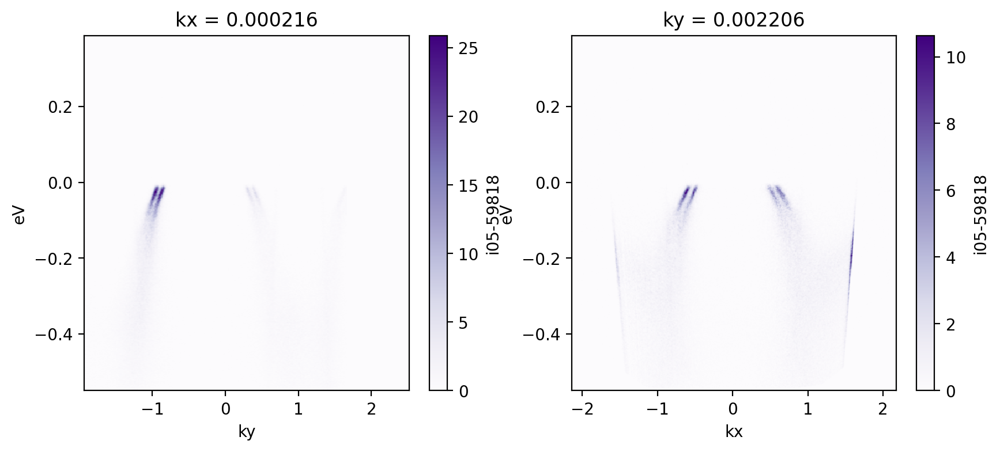

In [30]:
fig, axes = plt.subplots(ncols=2, figsize=(10,4))
FS_bin_k.sel(kx=0,method='nearest').plot(y='eV', ax=axes[0])
FS_bin_k.sel(ky=0,method='nearest').plot(y='eV', ax=axes[1])

### Photon energy scans

#### Loading hv-dep data/data format
In an $h\nu$ scan, the most natural representation of the data is as a 3d cube of ($hv$,theta_par,eV), however the eV axis in raw kinetic energy changes as a function of photon energy, adding some extra complexity.

In :class:`peaks`, the convention is to load (or assemble) a $h\nu$-dependent dataset into such a cube, where the eV coordinate (when in kinetic energy mode) is that of the first scan, while a second non-dimension coordinate is included which shows the relevant offset of the KE scale as a function of hv. A warning on load indicates this. 

In [31]:
# Load data (kz map)
hv1 = pks.load('i05-69294.nxs')
hv1.attrs['norm_tilt'] = 6.05

[########################################] | 100% Completed | 1.94 s


:::{note}
Due to this perculiar data structure, if a single scan is selected using the usual `.sel(hv=...)` method, the incorrect energy scale will be returned. We have a helper method, `disp_from_hv` to overcome this problem
:::

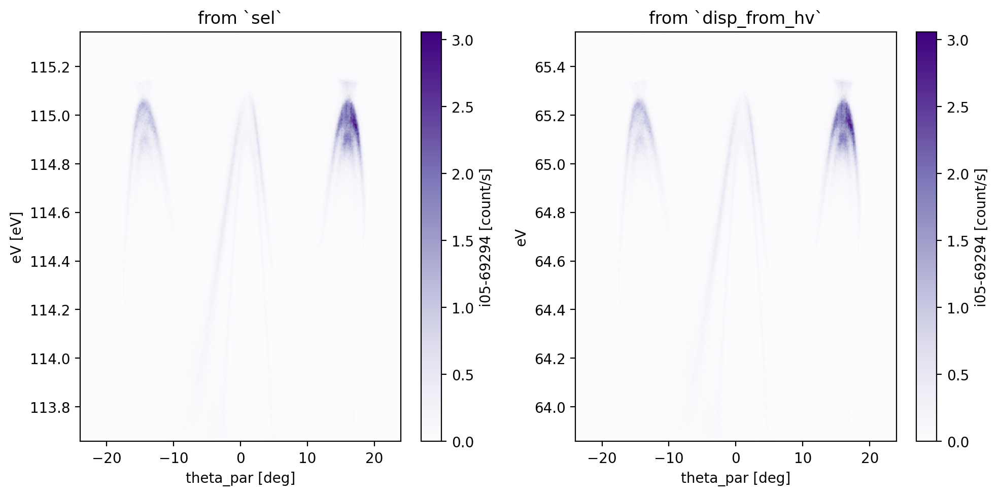

In [32]:
pks.plot_grid([hv1.sel(hv=70, method='nearest'),hv1.disp_from_hv(70)], titles=['from `sel`', 'from `disp_from_hv`'])

Note the incorrect energy scale on the left!

#### $k$-conversion

Fitting:   0%|          | 0/626 [00:00<?, ?it/s]

poly4


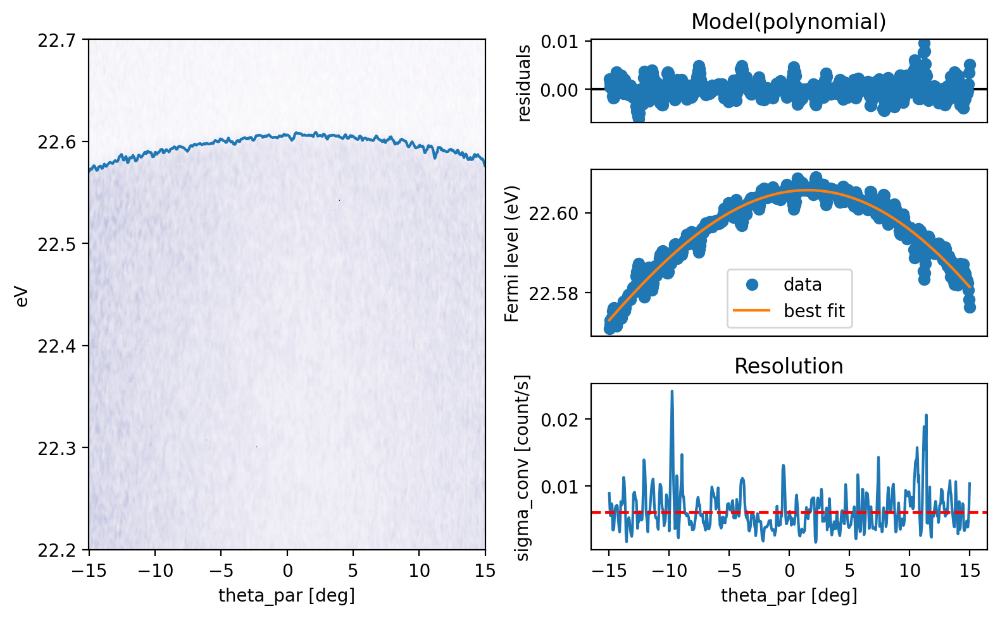

<div class="alert alert-block alert-success"><b>Au fitting results: </b> Polynomial Fermi level correction (order 4): c0: 22.605366, c1: 0.000414, c2: -0.000136, c3: -1e-06, c4: 0.0;   Average resolution: 0.006 eV </div>

In [33]:
# Load a gold reference scan for a single energy
gold = pks.load('i05-70214.nxs').sel(theta_par=slice(-15,15),eV=slice(22.2,22.7))
fit_result = gold.fit_gold()

This gives the angle-dependent correction, but an $h\nu$-dependent correction will also be required. This can be added as a new co-ordinate:

```python
data = data.coords.update({"EF": ("hv", estimated_EF)})
```
where estimated_EF is a :class:`numpy.ndarray` of length equal to the number of photon energies. Or it can be automatically estimated from `.estimate_EF()` which is run automatically if the `.k_convert` function is run with no Fermi correction already set.

In [34]:
# Adding the angle-dep part
hv1.EF_correction.set(fit_result)

# Set the inner potential and norm_tilt via the attributes - should change in future to dedicated methods
hv1.attrs["V0"] = 15
hv1.attrs["norm_tilt"] = 3.9


Converting data to k-space - initialising:   0%|          | 0/4 [00:00<?, ?it/s]

/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/scipy/ndimage/_filters.py:115: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  input = np.asarray(input)
/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/scipy/ndimage/_filters.py:115: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  input = np.asarray(input)
/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/scipy/ndimage/_filters.py:115: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  input = np.asarray(input)
/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/scipy/ndimage/_filters.py:115: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  input = np.asarray(input)
/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/scipy/ndimage/_filters.py:115: UnitStrippedWarning: The unit of the quantity is s

<div class="alert alert-block alert-info"><b>Analysis info: </b> Estimated Fermi level correction across the photon energy range via an order 3 polynomial fit as {'c0': '0.10026', 'c1': '0.83219', 'c2': '0.00200', 'c3': '-0.00001'} </div>

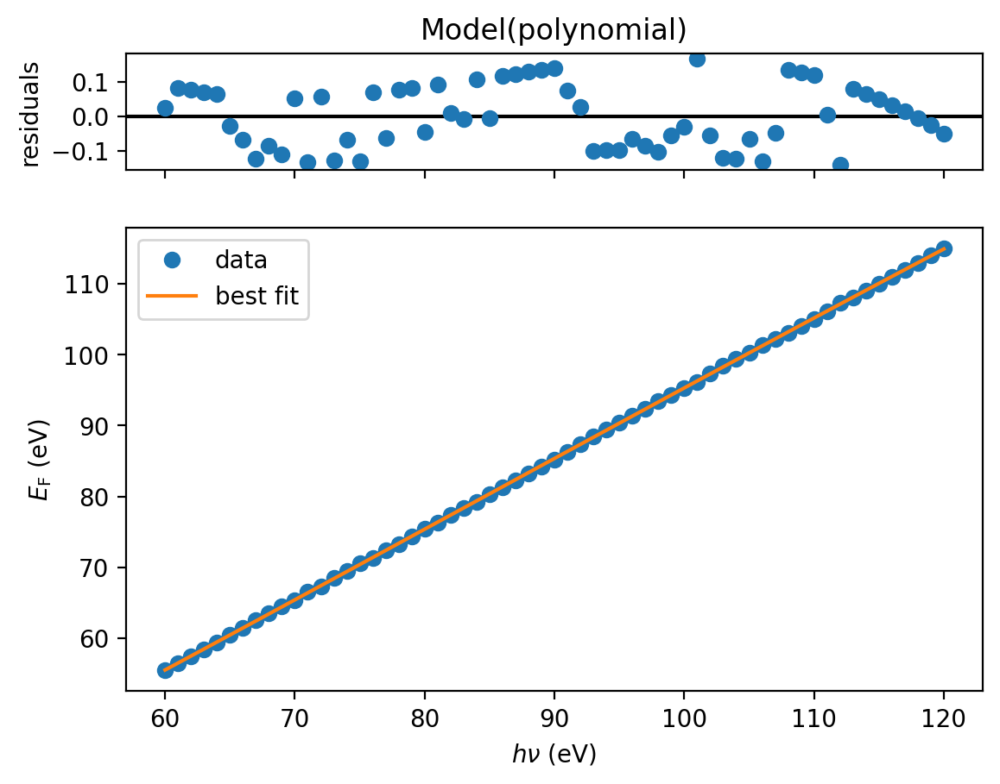

<div class="alert alert-block alert-warning"><b>Analysis warning: </b> EF_correction set from automatic estimation of Fermi level to: 55.50-114.91 eV (hv dependent). NB may not be accurate. </div>

/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/numexpr/necompiler.py:765: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  arguments.append(numpy.asarray(a))
/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2497: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  args = tuple(asanyarray(arg) for arg in args)
/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2497: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  args = tuple(asanyarray(arg) for arg in args)


Interpolating onto kz grid:   0%|                 | 0/158793000 [00:00<?, ?it/s]

In [35]:
# Now do the k-conversion and the rest is estimated
hv1_k = hv1.k_convert()

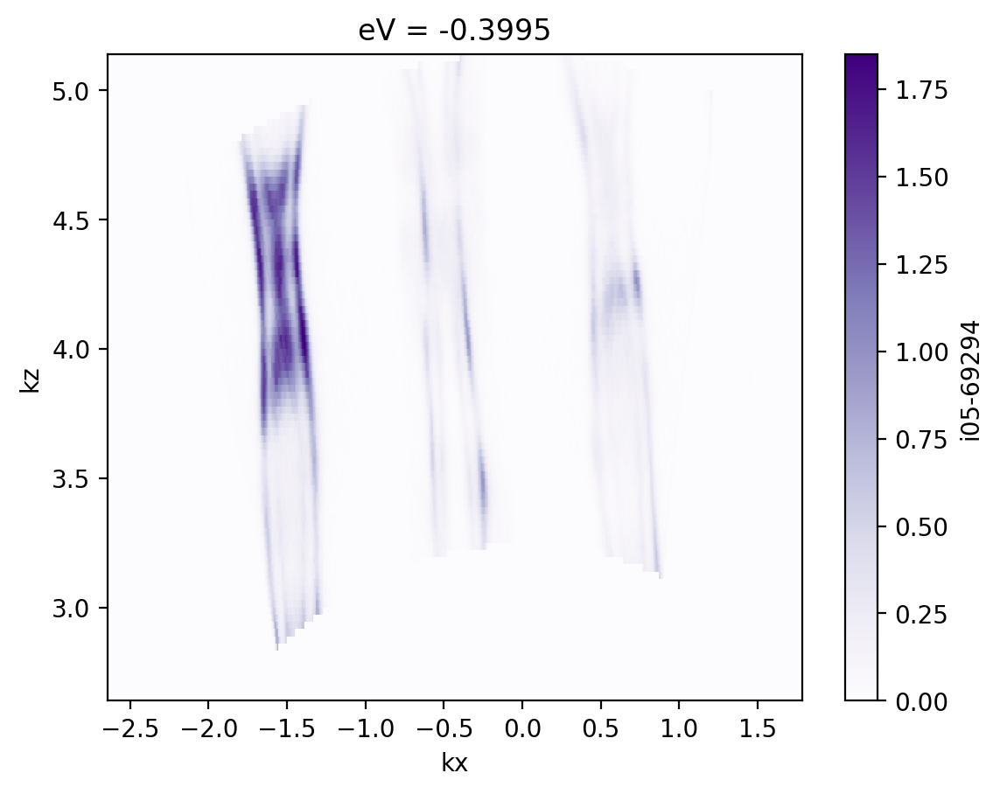

In [36]:
# Plot a slice through the map
hv1_k.drop_zero_borders().MDC(-0.40, 0.02).plot()

:::{tip}
Note the `.drop_zero_borders()` method (:class:`peaks.core.process.data_select.drop_zero_borders`)in the above - this trims any rows/columns/slices that are only zeros, useful to trim the borders. :class:`peaks.core.process.data_select.drop_nan_borders` is an equivalent function for border regions that are full of only NaNs.
:::

The other arguments for selecting the $k$ and $E$ range returned work as before, while an additional argument `return_kv_scan_in_hv` allows for the data to be returned vs. photon energy instead of $k_z$:

Converting data to k-space - initialising:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/numexpr/necompiler.py:765: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  arguments.append(numpy.asarray(a))
/Users/pdk6/miniconda3/envs/peaks-dev/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2497: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  args = tuple(asanyarray(arg) for arg in args)


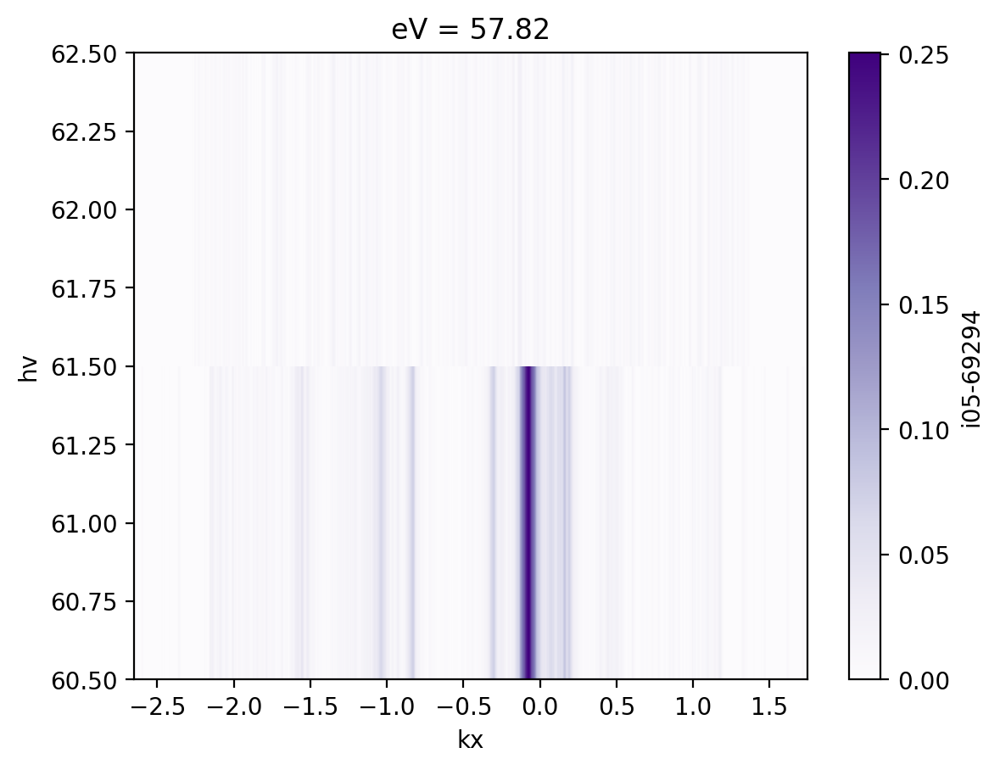

In [37]:
hv1_kip = hv1.k_convert(return_kz_scan_in_hv=True)
hv1_kip.MDC(-0.40, 0.02).drop_zero_borders().plot()

:::{note}
Note, the automatic Fermi energy estimation did not run this second time. This is because the estimated $h\nu$-dependent $E_\mathrm{F}$ correction was added to the original hv1 :class:`xarray.DataArray` on the first run.
:::

In [38]:
hv1.EF

<xarray.DataArray 'EF' (hv: 61)> Size: 488B
55.5 56.48 57.47 58.46 59.45 60.44 61.43 ... 110.1 111.0 112.0 113.0 113.9 114.9
Coordinates:
  * hv        (hv) float64 488B 60.0 61.0 62.0 63.0 ... 117.0 118.0 119.0 120.0
    KE_delta  (hv) float64 488B -59.76 -58.76 -57.77 ... -1.992 -0.996 0.0
    EF        (hv) float64 488B 55.5 56.48 57.47 58.46 ... 113.0 113.9 114.9

## Merging data
Scans can be merged together using the :class:`peaks.core.process.tools.merge_data` function, avaialble as `pks.merge_data`. By default this acts along the `theta_par` dimension, but can be applied along any dimension and to higher dimensional data, with various in-built options for specifying the offsets and pre-cropping the data:

In [39]:
#Load multiple scans into a list
disps = pks.load([f"210326_GM2-667_GK_{i}.xy" for i in range(1,4)], names=['Scan 1', 'Scan 2', 'Scan 3'])

# Merge the data, applying offsets in the default angle direction and trimming the data along this dimension 
merged_disp = pks.merge_data(disps, offsets=12, sel=slice(-10,10))

Loading data:   0%|          | 0/3 [00:00<?, ?it/s]

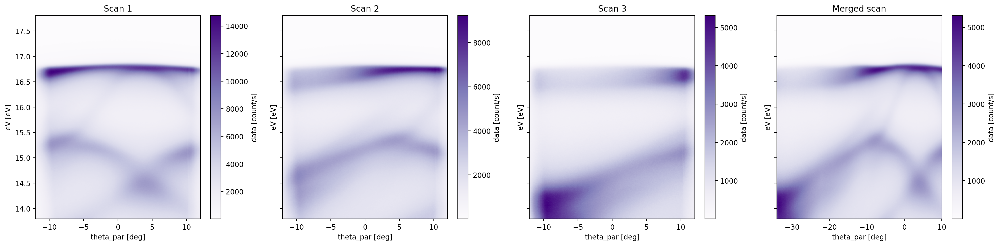

In [40]:
disps.add(merged_disp, name='Merged scan')
disps.plot_grid(ncols=4, sharey=True)

## Normalisation
To normalise data by a float, EDC/MDC, or region of interest, use :class:`peaks.core.process.tools.norm`, available via the `.norm()` accessor. This broadcasts across any number of dimenisons. Call with no argument to normalise to the max value, normalise by the mean by passign `all`, or by an integrated DC along a specified dimension, `dim`, or pass a keyword argument with `dim=slice(start,stop)` to define the region to make a DC to align by.

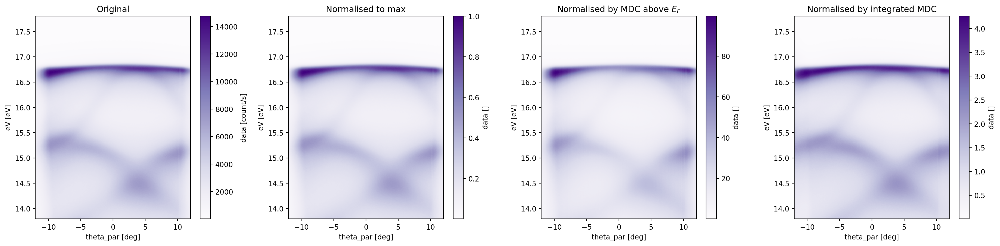

In [41]:
disp1_norm1 = disps['Scan 1'].data.norm()
disp1_norm2 = disps['Scan 1'].data.norm(eV=slice(17,17.5))
disp1_norm3 = disps['Scan 1'].data.norm('eV')
pks.plot_grid([disps['Scan 1'].data, disp1_norm1, disp1_norm2, disp1_norm3],
              titles=['Original','Normalised to max', "Normalised by MDC above $E_F$", "Normalised by integrated MDC"],
             ncols=4)

## Background subtraction
Background subtraction works in exactly the same way, except calling `.bgs`, with the relevant parameters passed definie the data to subtract, except that either the `subtraction` arguement must be passed (can be a `float` or `int` to subtract a constant), or a keyword argument must be supplied specifying the background region to subtract. In addition `subtraction="Shirley"` can be passed to specify subtraction of a Shirley background, in which case some additional arguments can be supplied to define options for the Shirley background determination. 

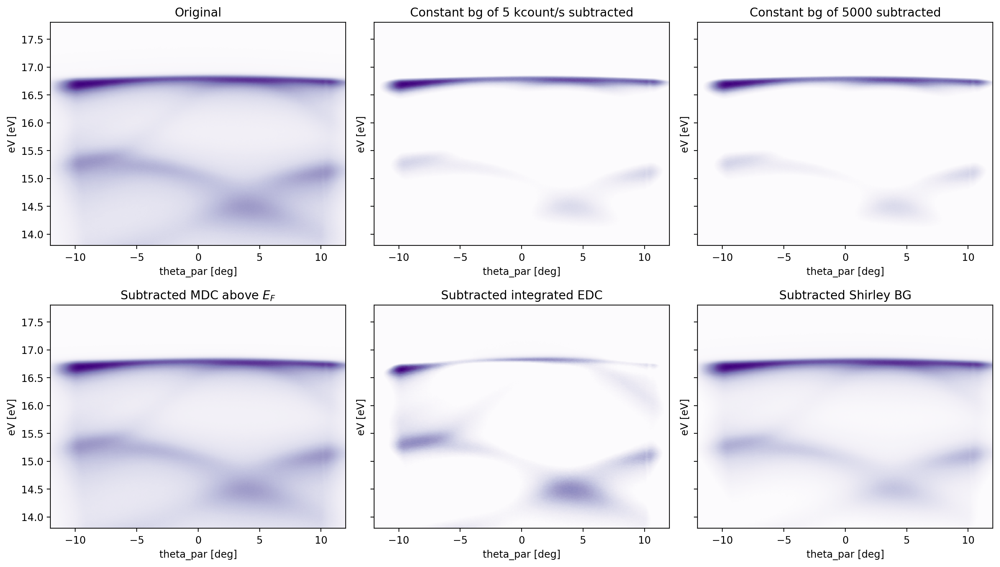

In [42]:
disp1_bgs1 = disps['Scan 1'].data.bgs(5*pks.ureg('kcount/s'))
disp1_bgs2 = disps['Scan 1'].data.bgs(5000)
disp1_bgs3 = disps['Scan 1'].data.bgs(eV=slice(17,17.5))
disp1_bgs4 = disps['Scan 1'].data.bgs('theta_par')
disp1_bgs5 = disps['Scan 1'].data.bgs('Shirley')
pks.plot_grid([disps['Scan 1'].data, disp1_bgs1, disp1_bgs2, disp1_bgs3, disp1_bgs4, disp1_bgs5],
              titles=['Original','Constant bg of 5 kcount/s subtracted', 'Constant bg of 5000 subtracted', 'Subtracted MDC above $E_F$', "Subtracted integrated EDC", "Subtracted Shirley BG"],
             ncols=3,
             vmin=0,
             sharey=True,
             add_colorbar=False,
             figsize=(14,8))

## Data binning
Binning can be performed using the `.bin_data()` function, which provides a thin wrapper around the built-in :class:`xarray.coarsen` function, but with updating of analysis history built in, and with a shortcut for uniform binning. 

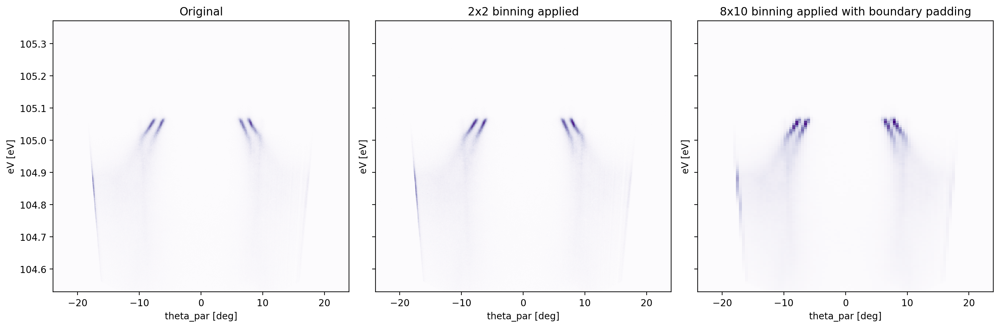

In [43]:
disp = pks.load('i05-59819.nxs')
binned_disps = [disp,
         disp.bin_data(2),
         disp.bin_data(eV=8,theta_par=10, boundary='pad'),
        ]
pks.plot_grid(binned_disps,
              titles=['Original', '2x2 binning applied', '8x10 binning applied with boundary padding'],
             sharey=True,
             add_colorbar=False
             )

`.bin_spectra` can also be used to enforce binning on only the spectral dimensions of an ARPES detector (`eV`, `theta_par`, `k_par`), useful e.g. for binning of spatial mapping or Fermi surface data to avoid binning also the spatial or coarse angular dimentions. Both can be applied directly to :class:`xarray.DataTree`s 

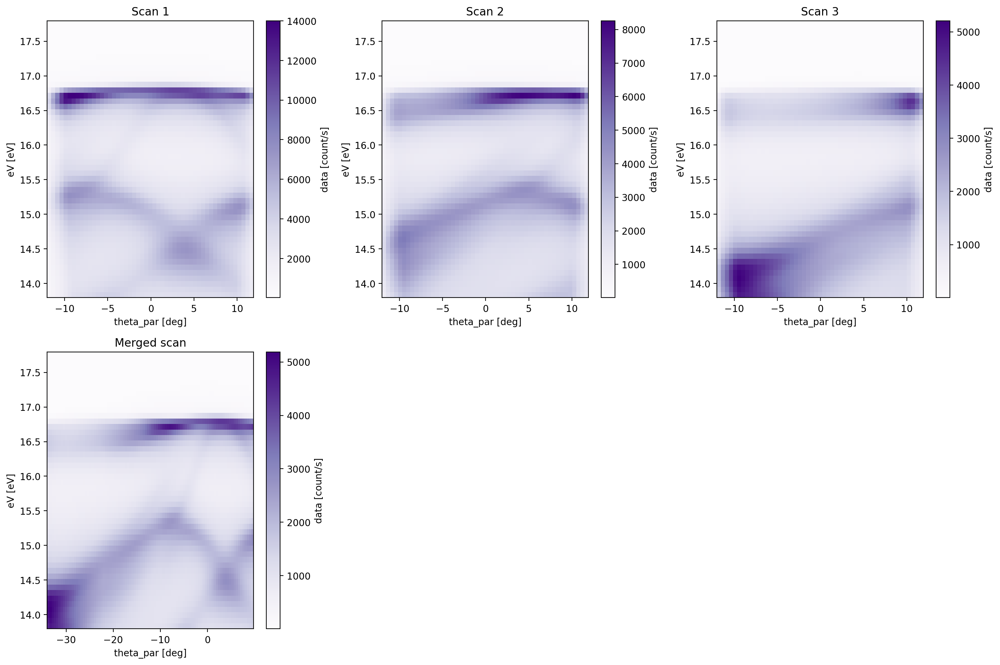

In [44]:
disps.bin_spectra(8).plot_grid()

## Smoothing

Smoothing of data can be applied using `peaks.core.process.tools.smooth`, or via the `.smooth` accessor, passing keyword argument(s) in the format `axis=FWHM`, where FWHM is the relevant FWHM of the Gaussian for convolution in this direction, e.g. eV=0.1. This broadcasts to multidimensional data.

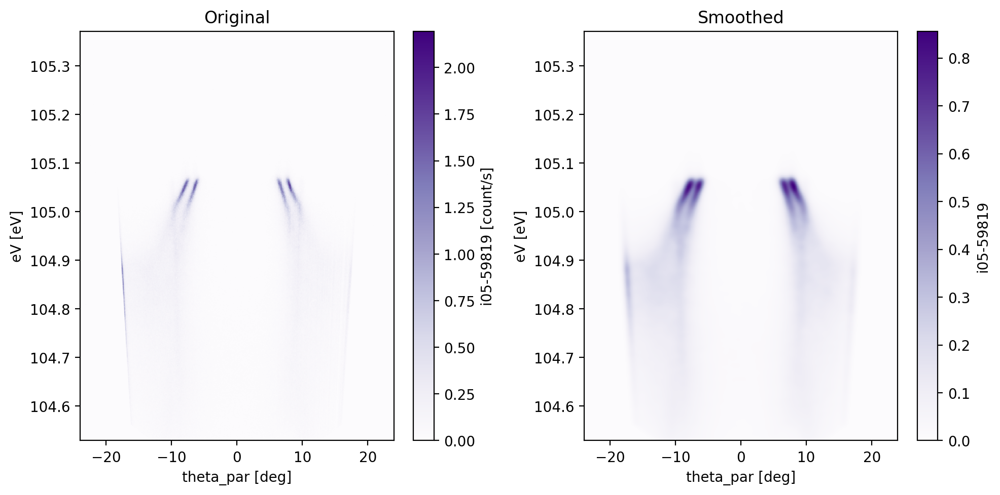

In [45]:
disp_smooth = disp.smooth(eV=10*pks.ureg('meV'),theta_par=1)
pks.plot_grid([disp, disp_smooth],
              titles=['Original','Smoothed'])

## Derivative-type methods
We have various wrappers around the built-in :class:`xarray.DataArray.differentiate` method to perform derivative methods for ARPES analysis, including updating the analysis history. `.deriv(dim=list_of_dims)` is our general method, but specific `.d2E()`, `.d2k()`, `.dEdk()`, `.dkdE()`, `.curvature()` and `.min_gradient()` methods exist to ease use of derivative methods for ARPES analsys. Note, often data must be pre-smoothed. 

:::{warning}
Note, derivative methods can introduce significant artefacts in ARPES data - use with extreme caution!
:::

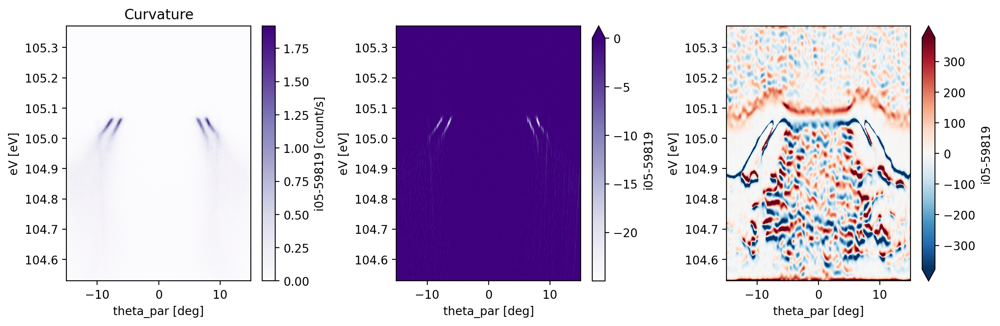

In [46]:
disp_d2k = disp.sel(theta_par=slice(-15,15)).smooth(eV=0.01,theta_par=0.2).d2k()
disp_curv = disp.sel(theta_par=slice(-15,15)).smooth(eV=0.03,theta_par=0.5).curvature(theta_par=500, eV=50)
fig, ax = plt.subplots(ncols=3, figsize=(12,4))
disp.sel(theta_par=slice(-15,15)).plot(ax=ax[0])
ax[0].set_title('Original')
disp_d2k.plot(ax=ax[1], vmax=0)
ax[0].set_title('d2/dk^2')
disp_curv.plot(ax=ax[2], robust=True)
ax[0].set_title('Curvature')
plt.tight_layout()

## Symmetrisation
The :class:`peaks.core.process.tools.sym` function (`.sym()` accessor) allows to symmetrise (or alternatively just flip) data around a given axis defined via a keyword argument to the function call.

### $E_\mathrm{F}$ symmetrisation
If no arguments are supplied, `.sym()` defults to symmetrising in energy around `eV=0`, useful e.g. for symmetrising about the Fermi level for gap analysis etc. 

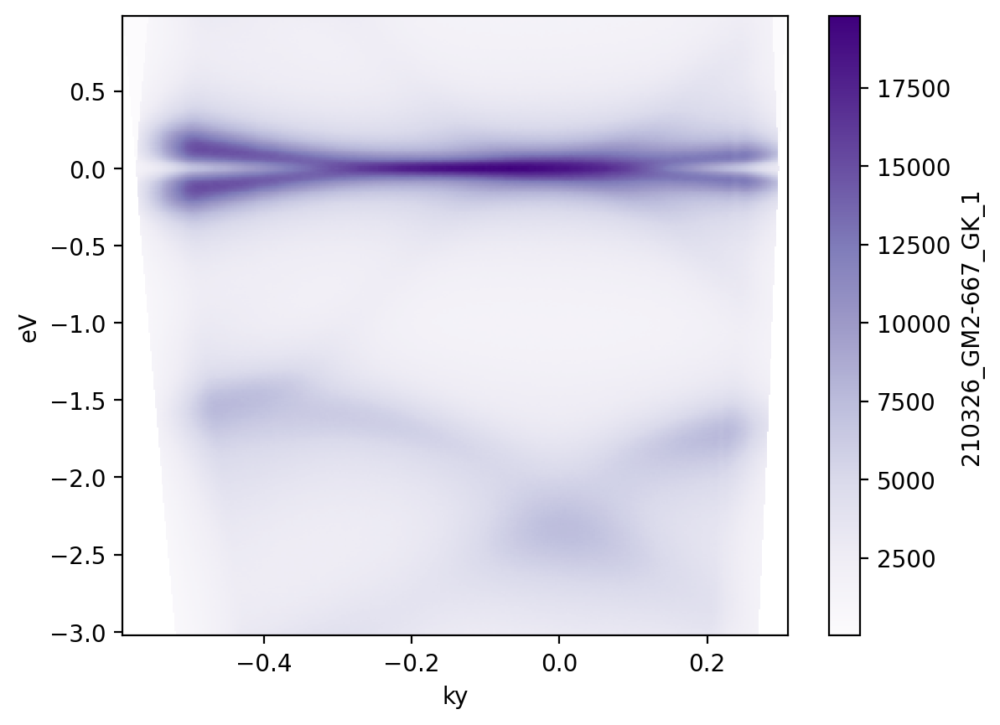

In [48]:
disp1_k.sym().plot()

In [54]:
disp1.sym(eV=16.8)

Magnitude,[[605.5593872070312 643.6488037109375 682.701416015625 ... 1708.410888671875 1646.42822265625 1584.1739501953125] [620.2568359375 648.6697387695312 680.6036376953125 ... 1682.79296875 1647.814453125 1598.43359375] [633.1063842773438 667.2102661132812 699.6781005859375 ... 1707.7618408203125 1671.57177734375 1613.5660400390625] ... [950.6004638671875 1004.5192260742188 1040.83935546875 ... 1827.8826904296875 1776.9473876953125 1702.0694580078125] [976.2118530273438 1027.106201171875 1066.583740234375 ... 1810.57421875 1737.2459716796875 1667.265869140625] [964.5420532226562 1011.9785766601562 1061.8564453125 ... 1821.576904296875 1746.428466796875 1689.964111328125]]
Units,count/s


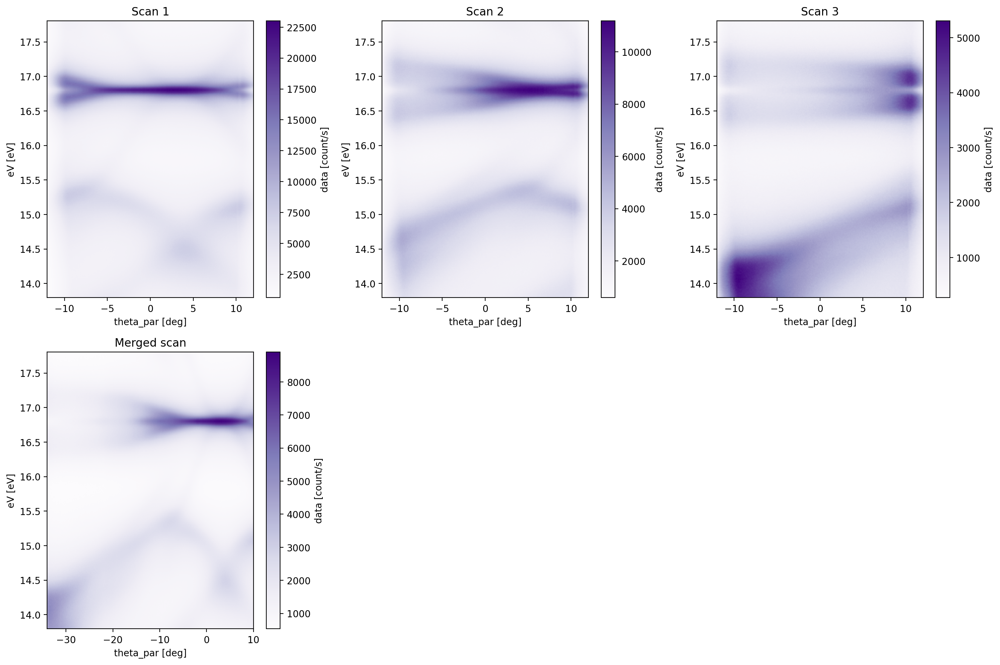

In [53]:
disps.sym(eV=16.8).plot_grid()

This broadcasts to higher dimensions, and can be used to also symmetrise in a different dimension, but can only be applied to symmetrisiation in a single axis.

### Rotational symmetrisation
The :class:`peaks.core.process.tools.sym_nfold` function (`.sym_nfold()` accessor) allows for $n$-fold symmetrisation of a 2D :class:`xarray.DataArray` around specified centre co-ordinates (defaults to (0,0)).

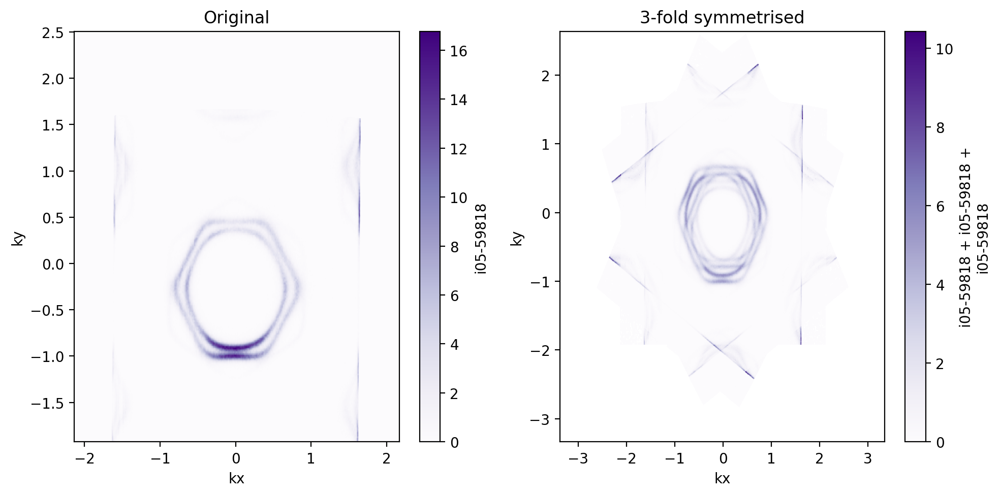

In [51]:
FSM_k_s3 = FSM_k.sym_nfold(3, kx=-0.003, ky=-0.136) # Rotate around these central positions as map was not centered
pks.plot_grid([FSM_k,FSM_k_s3], titles=['Original','3-fold symmetrised'])

## Grid removal

:::{note}
`peaks` currently has only a basic implementation of analyser detector mesh removal. For a more complete implementation see [Liu et al.](https://www.sciencedirect.com/science/article/pii/S0368204822000883)
:::

Automated mesh removal can be attempted with the `.degrid()` function

In [ ]:
# Load some data with detector mesh visible
disp2 = pks.load('i05-1-34301.nxs')
disp2_dg = disp2.degrid()

:::{warning}
This feature is currently experimental, and as is clear in the above example, can introduce artefacts in the data. Use with care!
:::